# 모듈 불러오기

In [1]:
from keras.models import Model
from keras.layers import *
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.preprocessing.image import ImageDataGenerator
import keras.backend as K
from keras.callbacks import LearningRateScheduler, ModelCheckpoint
from keras.utils import to_categorical
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split
import os
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import nibabel as nb
import glob

Using TensorFlow backend.


# 경로 설정하기

In [2]:
BASE_PATH = 'D:\\yonsei_tutoring'
BRAIN_TUMOR_PATH = os.path.join(BASE_PATH, 'segmentation', 'brain_tumor')
TRAIN_DATA_PATH = os.path.join(BRAIN_TUMOR_PATH, 'brain_tumor_train.npz')
TEST_DATA_PATH = os.path.join(BRAIN_TUMOR_PATH, 'brain_tumor_test.npz')

# **하이퍼 파라미터**
하이퍼 파라미터를 이용해 인공지능 모델을 조정합니다.  
주로 사용하는 하이퍼 파라미터는 다음과 같습니다.

In [3]:
IMG_HEIGHT, IMG_WIDTH = (192, 144)
EPOCHS = 30
BATCH_SIZE = 5
INIT_FILTERS = 32
LEARNING_RATE = 2e-4
DECAY_RATE = 0.9
SEED = 42
ACTIVATION_FN = 'elu' # relu, elu, sigmoid
DROP_RATE = 0.25
VAL_RATIO = 0.2

# **데이터 불러오기**

이미지와 레이블 데이터를 불러옵니다.  
np.load 함수를 이용해 데이터를 불러올 수 있습니다.

In [4]:
total_train = np.load(TRAIN_DATA_PATH)
total_test = np.load(TEST_DATA_PATH)

train_val_input = total_train['input']
train_val_label = total_train['label']

test_input1 = total_test['input1']
test_label1 = total_test['label1']

test_input2 = total_test['input2']
test_label2 = total_test['label2']

test_input3 = total_test['input3']
test_label3 = total_test['label3']

불러온 데이터를 학습용 데이터와 검증용 데이터로 나눕시다.

In [5]:
train_input, val_input, train_label, val_label = train_test_split(train_val_input, train_val_label, test_size=VAL_RATIO)
print('훈련 데이터 개수: ', len(train_input))
print('검증 데이터 개수: ', len(val_input))

훈련 데이터 개수:  141
검증 데이터 개수:  36


# 데이터 확인하기

In [6]:
print('train :', np.shape(train_input), np.shape(train_label),
      '\n  val :', np.shape(val_input), np.shape(val_label),
      '\ntest1 :', np.shape(test_input1), np.shape(test_label1),
      '\ntest2 :', np.shape(test_input2), np.shape(test_label2),
      '\ntest3 :', np.shape(test_input3), np.shape(test_label3))

train : (141, 192, 144, 1) (141, 192, 144, 1) 
  val : (36, 192, 144, 1) (36, 192, 144, 1) 
test1 : (60, 192, 144, 1) (60, 192, 144, 1) 
test2 : (32, 192, 144, 1) (32, 192, 144, 1) 
test3 : (44, 192, 144, 1) (44, 192, 144, 1)


# 3D 데이터에서 2D 데이터로 변환?

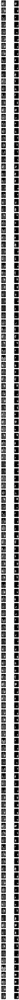

In [7]:
len0 = len(train_input)
fig, ax = plt.subplots(len0, 2, figsize=(10, len0 * 3))
for i in range(len0):
    ax[i,0].imshow(train_input[i,:,:,0], cmap='gray')
    ax[i,1].imshow(train_label[i,:,:,0], cmap='gray', vmin=0, vmax=3)
plt.show()

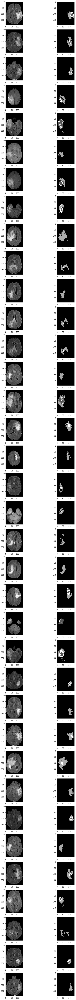

In [69]:
len1 = len(val_input)
fig, ax = plt.subplots(len1, 2, figsize=(10, len1 * 3))
for i in range(len1):
    ax[i,0].imshow(val_input[i,:,:,0], cmap='gray')
    ax[i,1].imshow(val_label[i,:,:,0], cmap='gray', vmin=0, vmax=3)
plt.show()

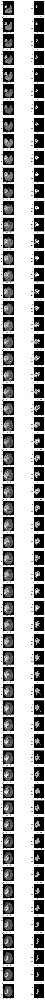

In [8]:
len2 = len(test_input1)
fig, ax = plt.subplots(len2, 2, figsize=(10, len2 * 3))
for i in range(len2):
    ax[i,0].imshow(test_input1[i,:,:,0], cmap='gray')
    ax[i,1].imshow(test_label1[i,:,:,0], cmap='gray', vmin=0, vmax=3)
plt.show()

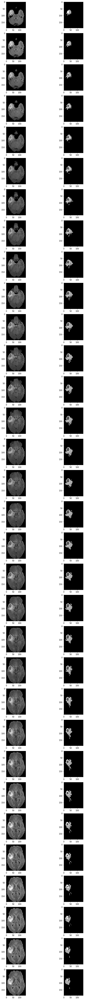

In [109]:
len3 = len(test_input2)
fig, ax = plt.subplots(len3, 2, figsize=(10, len3 * 3))
for i in range(len3):
    ax[i,0].imshow(test_input2[i,:,:,0], cmap='gray')
    ax[i,1].imshow(test_label2[i,:,:,0], cmap='gray', vmin=0, vmax=3)
plt.show()

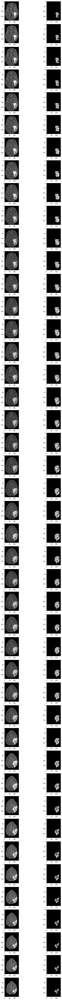

In [9]:
len4 = len(test_input3)
fig, ax = plt.subplots(len4, 2, figsize=(10, len4 * 3))
for i in range(len4):
    ax[i,0].imshow(test_input3[i,:,:,0], cmap='gray')
    ax[i,1].imshow(test_label3[i,:,:,0], cmap='gray', vmin=0, vmax=3)
plt.show()

In [10]:
sample = np.array([0, 0, 1, 2, 3, 3, 3, 0])
sample_c = to_categorical(sample, num_classes=4)
sample_r = np.argmax(sample_c, axis=-1)
for i in range(8):
    print('sample :', sample[i], ', sample_categorical :', sample_c[i], ', sample_reverse :', sample_r[i])

sample : 0 , sample_categorical : [1. 0. 0. 0.] , sample_reverse : 0
sample : 0 , sample_categorical : [1. 0. 0. 0.] , sample_reverse : 0
sample : 1 , sample_categorical : [0. 1. 0. 0.] , sample_reverse : 1
sample : 2 , sample_categorical : [0. 0. 1. 0.] , sample_reverse : 2
sample : 3 , sample_categorical : [0. 0. 0. 1.] , sample_reverse : 3
sample : 3 , sample_categorical : [0. 0. 0. 1.] , sample_reverse : 3
sample : 3 , sample_categorical : [0. 0. 0. 1.] , sample_reverse : 3
sample : 0 , sample_categorical : [1. 0. 0. 0.] , sample_reverse : 0


In [11]:
train_label = to_categorical(train_label, num_classes=4, dtype='float32')
val_label = to_categorical(val_label, num_classes=4, dtype='float32')
test_label1 = to_categorical(test_label1, num_classes=4, dtype='float32')
test_label2 = to_categorical(test_label2, num_classes=4, dtype='float32')
test_label3 = to_categorical(test_label3, num_classes=4, dtype='float32')

In [12]:
print('train :', np.shape(train_input), np.shape(train_label),
      '\n  val :', np.shape(val_input), np.shape(val_label),
      '\ntest1 :', np.shape(test_input1), np.shape(test_label1),
      '\ntest2 :', np.shape(test_input2), np.shape(test_label2),
      '\ntest3 :', np.shape(test_input3), np.shape(test_label3))
# print(np.shape(np.argmax(train_label, axis=-1)))

train : (141, 192, 144, 1) (141, 192, 144, 4) 
  val : (36, 192, 144, 1) (36, 192, 144, 4) 
test1 : (60, 192, 144, 1) (60, 192, 144, 4) 
test2 : (32, 192, 144, 1) (32, 192, 144, 4) 
test3 : (44, 192, 144, 1) (44, 192, 144, 4)


# 뇌종양 영역 분리 AI 모델 만들기

# (코드에 중복되는 부분이 많은데?) -> 함수 만들기

In [ ]:
def conv_layer(layer, filters, activation):
    layer = Conv2D(filters=filters, kernel_size=(3, 3), activation=None, padding='same')(layer)
    layer = BatchNormalization()(layer)
    layer = Activation(activation)(layer)
    return layer

In [13]:
input_layer = Input(shape=train_input.shape[1:])

filters = INIT_FILTERS
c1 = conv_layer(layer=input_layer, filters=filters, activation=ACTIVATION_FN)
l = MaxPool2D(strides=(2, 2))(c1)

filters *= 2
c2 = Conv2D(filters=filters, kernel_size=(3, 3), activation=None, padding='same')(l)
c2 = BatchNormalization()(c2)
c2 = Activation(ACTIVATION_FN)(c2)
l = MaxPool2D(strides=(2, 2))(c2)

filters *= 2
c3 = Conv2D(filters=filters, kernel_size=(3, 3), activation=None, padding='same')(l)
c3 = BatchNormalization()(c3)
c3 = Activation(ACTIVATION_FN)(c3)
l = MaxPool2D(strides=(2, 2))(c3)

filters *= 2
c4 = Conv2D(filters=filters, kernel_size=(1, 1), activation=None, padding='same')(l)
c4 = BatchNormalization()(c4)
c4 = Activation(ACTIVATION_FN)(c4)
l = concatenate([UpSampling2D(size=(2, 2))(c4), c3], axis=-1)

l = Conv2D(filters=filters, kernel_size=(2, 2), activation=None, padding='same')(l)
l = BatchNormalization()(l)
l = Activation(ACTIVATION_FN)(l)
l = concatenate([UpSampling2D(size=(2, 2))(l), c2], axis=-1)

filters //= 2
l = Conv2D(filters=filters, kernel_size=(2, 2), activation=None, padding='same')(l)
l = BatchNormalization()(l)
l = Activation(ACTIVATION_FN)(l)
l = concatenate([UpSampling2D(size=(2, 2))(l), c1], axis=-1)

filters //= 2
l = Conv2D(filters=filters, kernel_size=(2, 2), activation=None, padding='same')(l)
l = BatchNormalization()(l)
l = Activation(ACTIVATION_FN)(l)

filters //= 2
l = Conv2D(filters=filters, kernel_size=(1, 1), activation=None, padding='same')(l)
l = BatchNormalization()(l)
l = Activation(ACTIVATION_FN)(l)
l = Dropout(DROP_RATE)(l)

output_layer = Conv2D(filters=4, kernel_size=(1, 1), activation='softmax')(l)
    
model = Model(input_layer, output_layer)
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 192, 144, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 192, 144, 32) 320         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 192, 144, 32) 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 192, 144, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
max_poolin

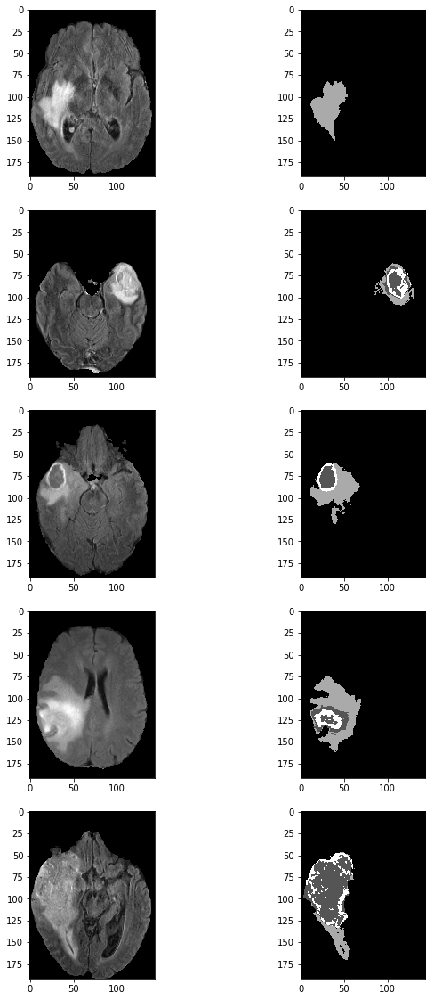

In [14]:
img_generator = ImageDataGenerator().flow(train_input, batch_size=BATCH_SIZE, shuffle=True, seed=SEED)

mask_generator = ImageDataGenerator().flow(train_label, batch_size=BATCH_SIZE, shuffle=True, seed=SEED)

data_generator = zip(img_generator, mask_generator)

i_batch, m_batch = next(data_generator)

fix, ax = plt.subplots(5, 2, figsize=(10,20))
for i in range(5):
    ax[i, 0].imshow(i_batch[i, :, :, 0], cmap='gray')
    ax[i, 1].imshow(np.argmax(m_batch, axis=-1)[i], cmap='gray', vmin=0, vmax=3)
plt.show()

In [15]:
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + K.epsilon()) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())

In [16]:
model.compile(optimizer=Adam(LEARNING_RATE), loss='categorical_crossentropy', metrics=[dice_score])
weight_saver = ModelCheckpoint('brain.h5', monitor='val_dice_score', save_best_only=True, save_weights_only=True)
decayed_lr = LearningRateScheduler(lambda x: LEARNING_RATE * DECAY_RATE ** x)

# AI 모델 훈련하기

In [97]:
history = model.fit(train_input, train_label,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(val_input, val_label),
                    shuffle=True,
                    verbose=2,
                    callbacks=[weight_saver, decayed_lr])

Train on 141 samples, validate on 36 samples
Epoch 1/30
 - 132s - loss: 1.2994 - dice_score: 0.3601 - val_loss: 0.7788 - val_dice_score: 0.5421
Epoch 2/30
 - 132s - loss: 0.9659 - dice_score: 0.4470 - val_loss: 0.7465 - val_dice_score: 0.5405
Epoch 3/30
 - 132s - loss: 0.8463 - dice_score: 0.4934 - val_loss: 0.7569 - val_dice_score: 0.5178
Epoch 4/30
 - 137s - loss: 0.7666 - dice_score: 0.5263 - val_loss: 0.7929 - val_dice_score: 0.5380
Epoch 5/30
 - 143s - loss: 0.7157 - dice_score: 0.5543 - val_loss: 0.7559 - val_dice_score: 0.5438
Epoch 6/30
 - 137s - loss: 0.6751 - dice_score: 0.5764 - val_loss: 0.7029 - val_dice_score: 0.5515
Epoch 7/30
 - 136s - loss: 0.6350 - dice_score: 0.5949 - val_loss: 0.6768 - val_dice_score: 0.5820
Epoch 8/30
 - 137s - loss: 0.6087 - dice_score: 0.6094 - val_loss: 0.6188 - val_dice_score: 0.6090
Epoch 9/30
 - 138s - loss: 0.5880 - dice_score: 0.6216 - val_loss: 0.6504 - val_dice_score: 0.6209
Epoch 10/30
 - 134s - loss: 0.5622 - dice_score: 0.6348 - val_lo

# 훈련 결과 확인하기

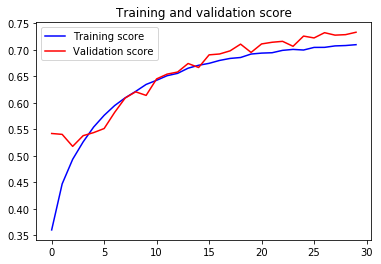

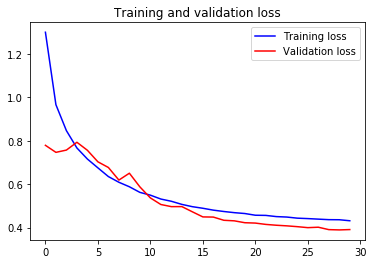

In [98]:
dice_score = history.history['dice_score']
val_dice_score = history.history['val_dice_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(dice_score))

plt.plot(epochs, dice_score, 'b', color='blue', label='Training score')
plt.plot(epochs, val_dice_score, 'b', color='red', label='Validation score')
plt.title('Training and validation score')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', color='blue', label='Training loss')
plt.plot(epochs, val_loss, 'b', color='red', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# 이미지로 결과 확인하기

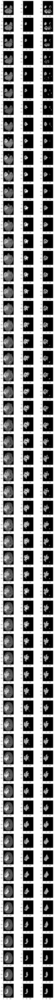

In [113]:
len1 = len(test_input1)

fix, ax = plt.subplots(len1, 3, figsize=(10, len1 * 3))

for i in range(len1):
    pred = model.predict(test_input1[i][np.newaxis, :, : ,:])
    mask = np.argmax(pred, axis=-1)
    label = np.argmax(test_label1[i], axis=-1)

    ax[i, 0].imshow(test_input1[i, :, :, 0], cmap='gray')
    ax[i, 1].imshow(label, cmap='gray', vmin=0, vmax=3)
    ax[i, 2].imshow(mask[0], cmap='gray', vmin=0, vmax=3)
    
plt.show()

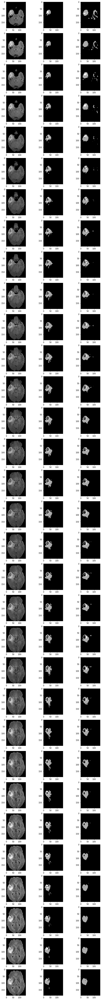

In [114]:
len2 = len(test_input2)

fix, ax = plt.subplots(len2, 3, figsize=(10, len2 * 3))

for i in range(len2):
    pred = model.predict(test_input2[i][np.newaxis, :, : ,:])
    mask = np.argmax(pred, axis=-1)
    label = np.argmax(test_label2[i], axis=-1)

    ax[i, 0].imshow(test_input2[i, :, :, 0], cmap='gray')
    ax[i, 1].imshow(label, cmap='gray', vmin=0, vmax=3)
    ax[i, 2].imshow(mask[0], cmap='gray', vmin=0, vmax=3)
    
plt.show()

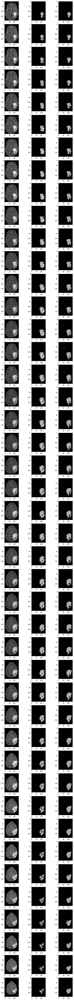

In [115]:
len3 = len(test_input3)

fix, ax = plt.subplots(len3, 3, figsize=(10, len3 * 3))

for i in range(len3):
    pred = model.predict(test_input3[i][np.newaxis, :, : ,:])
    mask = np.argmax(pred, axis=-1)
    label = np.argmax(test_label3[i], axis=-1)

    ax[i, 0].imshow(test_input3[i, :, :, 0], cmap='gray')
    ax[i, 1].imshow(label, cmap='gray', vmin=0, vmax=3)
    ax[i, 2].imshow(mask[0], cmap='gray', vmin=0, vmax=3)
    
plt.show()